# New CVID data

### Analysis based on GEX and SoupX-denoised protein

16.02.2021: annotation after reanalysis after bertie bug correction

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

aiohttp==3.6.2
airr==1.3.1
alembic==1.3.0
anndata==0.7.5
annoy==1.16.2
async-generator==1.10
async-timeout==3.0.1
attrs==19.3.0
backcall==0.1.0
bbknn==1.3.6
bleach==3.1.0
blinker==1.4
CellPhoneDB==2.1.5
certifi==2019.9.11
certipy==0.1.3
cffi==1.13.2
chardet==3.0.4
click==6.7
conda==4.7.12
conda-package-handling==1.6.0
cryptography==2.8
cycler==0.10.0
Cython==0.29.14
decorator==4.4.1
defusedxml==0.6.0
entrypoints==0.3
fbpca==1.0
geosketch==0.3
get-version==2.1
h5py==2.10.0
idna==2.7
imageio==2.9.0
importlib-metadata==0.23
intervaltree==2.1.0
ipykernel==5.1.3
ipython==7.9.0
ipython-genutils==0.2.0
jedi==0.15.1
Jinja2==2.10.3
joblib==0.14.0
json5==0.8.5
jsonschema==3.1.1
jupyter-client==5.3.3
jupyter-core==4.5.0
jupyter-rsession-proxy==1.0b6
jupyter-server-proxy==1.2.0
jupyterhub==1.0.0
jupyterlab==1.2.1
jupyterlab-server==1.0.6
kiwisolver==1.1.0
legacy-api-wrap==1.2
leidenalg==0.7.0
llvmlite==0.30.0
loompy==3.0.6
louvain==0.6.1
Mako==1.1.0
MarkupSafe==1.1.1
matplotlib==3.3.4
mistune==0.8

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
annoy               NA
attr                19.3.0
backcall            0.1.0
bbknn               NA
cffi                1.13.2
constants           NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.1
get_version         2.1
h5py                2.10.0
highs_wrapper       NA
igraph              0.7.1
importlib_metadata  0.23
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
joblib              0.14.0
kiwisolver          1.1.0
legacy_api_wrap     1.2
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.3.4
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
numba               0.46.0
numexpr             2.7.0
numpy               1.17.4
packaging           19.2
pandas              0.25.3
parso               0.5.1
pexpect        

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

## Reding the processed & analysed object

GEX + SoupX-denoised protein based analysis, BBKNN batch correction

In [135]:
# reading
adata = sc.read(save_path+'adata_hvg_bbknn_by_sample_GEX_and_SoupX_denoised_protein_validation_cohort_20210212.h5ad')

In [136]:
adata

AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 

In [137]:
# getting the full metadata table
adata4cellxgene = sc.read(save_path+'adata_for_cellxgene_GEX_and_SoupX_denoised_protein_BBKNN_validation_cohort_20210212.h5ad')

In [138]:
adata4cellxgene

AnnData object with n_obs × n_vars = 107050 × 21749
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'barcode', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5',

In [139]:
# adding all the metadata to this object
for col in adata4cellxgene.obs.columns:
    print(col)
    adata.obs[col] = adata4cellxgene.obs.loc[adata.obs_names,col]

batch
bh_pval
cell_id
dataset
n_counts
n_genes
percent_mito
sample
scrublet_cluster_score
scrublet_score
stimulation
technique
is_doublet
donor
prelim_annot
celltype_predictions
probabilities
S_score
G2M_score
phase
n_counts_protein
n_counts_protein_lognorm
louvain
barcode
Age
Sex
Age of disease onset
Autoimmunity
Gastrointestinal disease
Lung disease (bronchiectasis)
Lymphoadenopathy 
Splenomegaly
History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members
CVID_status


In [140]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

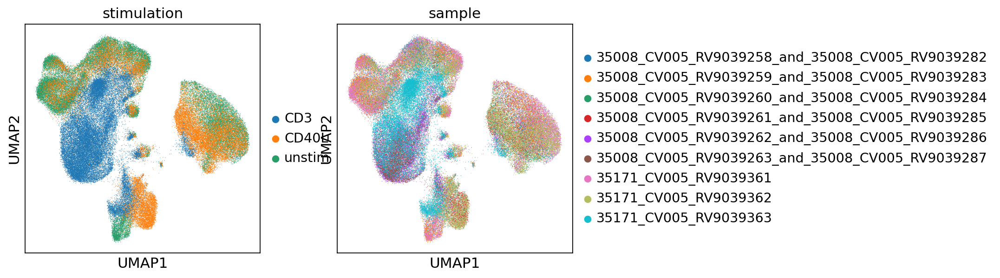

In [141]:
sc.pl.umap(adata, color=['stimulation','sample'])

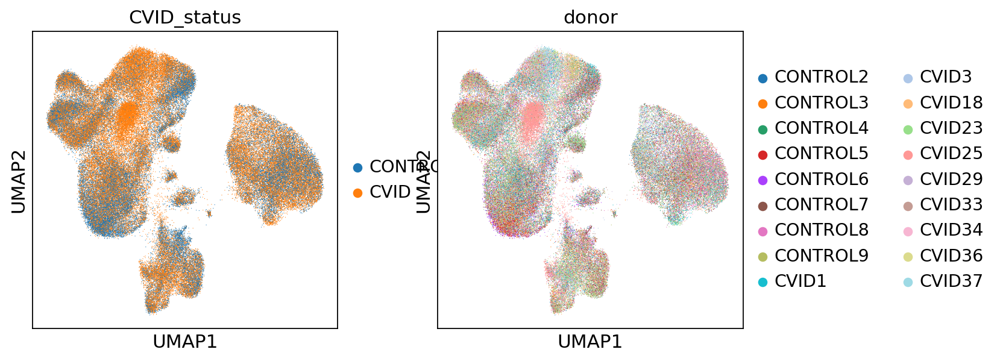

In [142]:
sc.pl.umap(adata, color=['CVID_status','donor'])

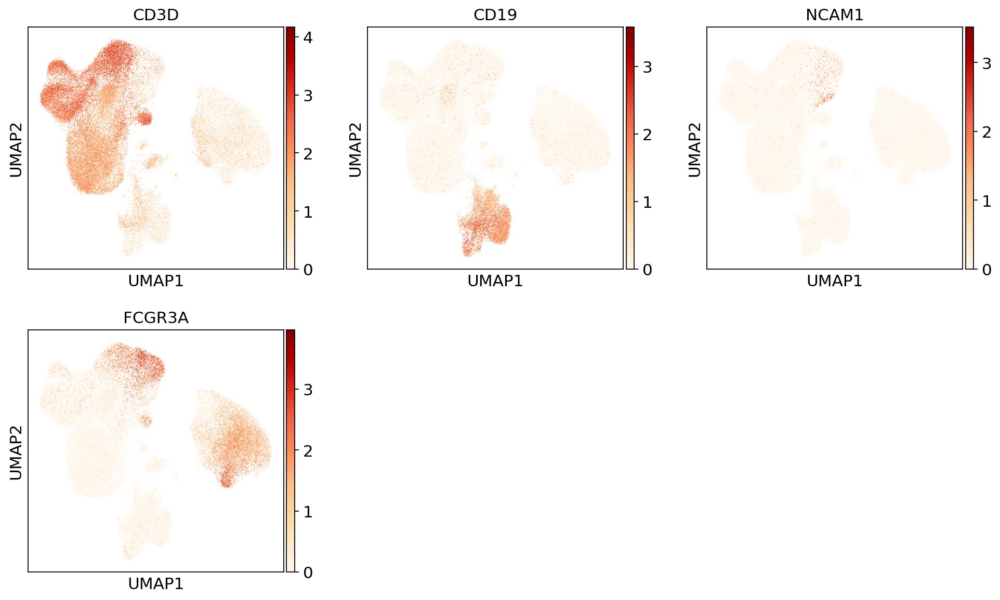

In [143]:
sc.pl.umap(adata, color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], ncols=3, use_raw=True, cmap='OrRd')

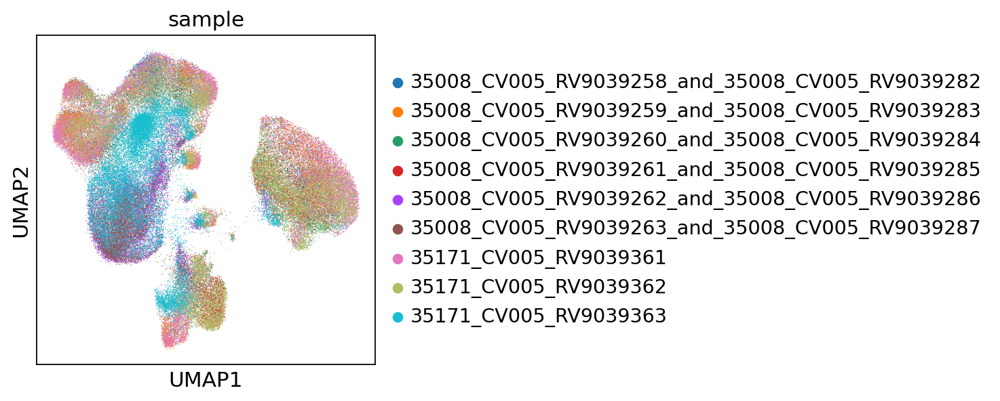

In [144]:
sc.pl.umap(adata, color=['sample'])

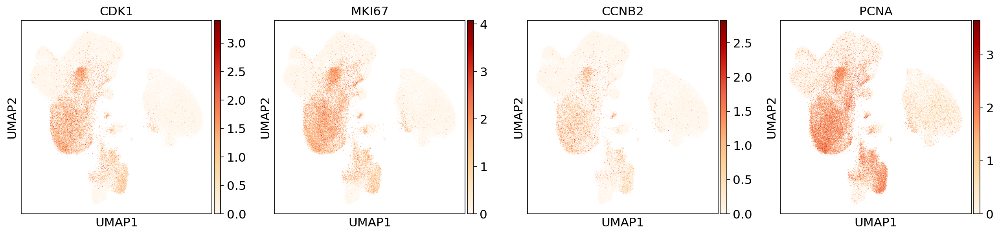

In [145]:
sc.pl.umap(adata, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [146]:
adata

AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'barcode', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 

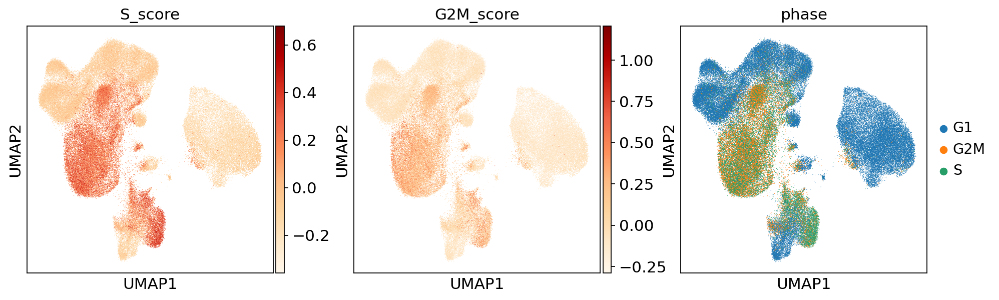

In [147]:
sc.pl.umap(adata, color=['S_score','G2M_score','phase'], cmap='OrRd')

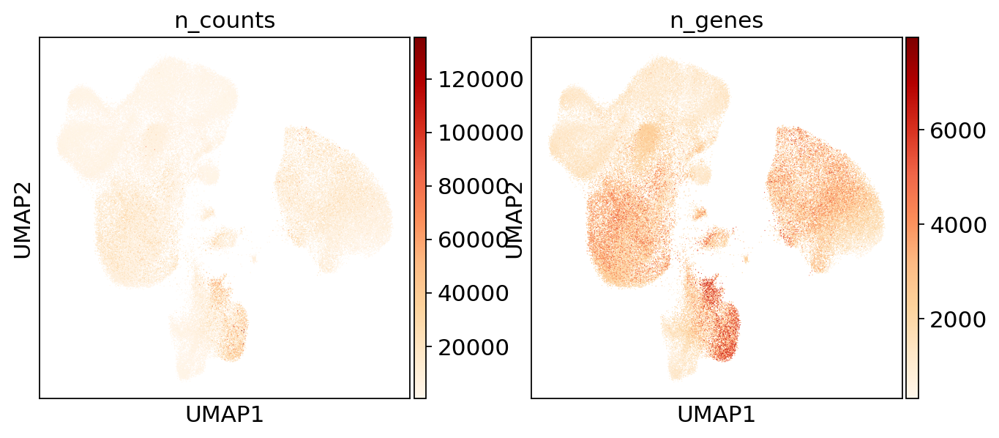

In [148]:
sc.pl.umap(adata, color=['n_counts',
                             'n_genes'], cmap='OrRd')

# Annotation

In [149]:
adata.obs['louvain'] = adata.obs['louvain'].astype(str)

... storing 'louvain' as categorical


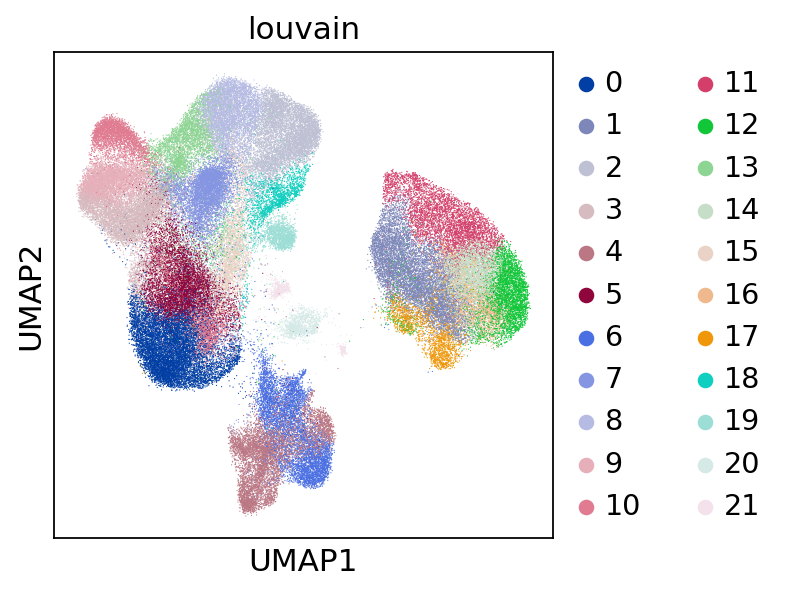

In [150]:
sc.pl.umap(adata, color=['louvain'])

In [151]:
default_louvain_colors = adata.uns['louvain_colors']
default_louvain_colors

['#023fa5',
 '#7d87b9',
 '#bec1d4',
 '#d6bcc0',
 '#bb7784',
 '#8e063b',
 '#4a6fe3',
 '#8595e1',
 '#b5bbe3',
 '#e6afb9',
 '#e07b91',
 '#d33f6a',
 '#11c638',
 '#8dd593',
 '#c6dec7',
 '#ead3c6',
 '#f0b98d',
 '#ef9708',
 '#0fcfc0',
 '#9cded6',
 '#d5eae7',
 '#f3e1eb']

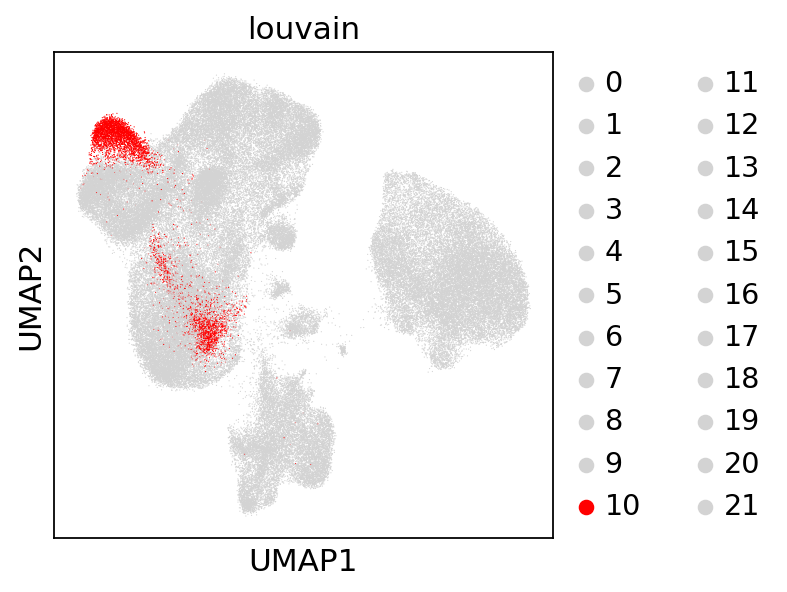

In [152]:
sc.pl.umap(adata, color=['louvain'], palette=['lightgrey']*10 + ['red'] + ['lightgrey']*11)

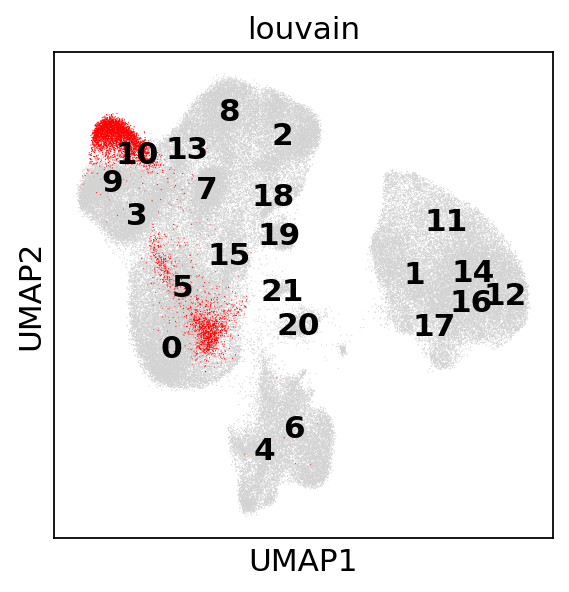

In [153]:
sc.pl.umap(adata, color=['louvain'], legend_loc='on data')

In [154]:
# 7 - iNKT_cells
# 9 - T4_naive
# 3 - T4_memory
# 19 - T_gd
# 20 - cDC1
# 15 - T8_activated
# 0 - T4_activated
# 5 - T_regs
# 11 - Macrophages
# 1 - cDC1
# 12 - Monocytes_intermediate
# 14, 16 - Monocytes_classical
# 17 - Monocytes_non-classical

Clusters to zoom in on:
- 8
- 13
- 10
- 21
- 4+6 (B cells)
- 2
- 18

In [155]:
# zoom into cluster 8
sc.tl.louvain(adata, restrict_to=('louvain',['8']),
             key_added='louvain_R_8',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain_R_8', the cluster labels (adata.obs, categorical) (0:00:00)


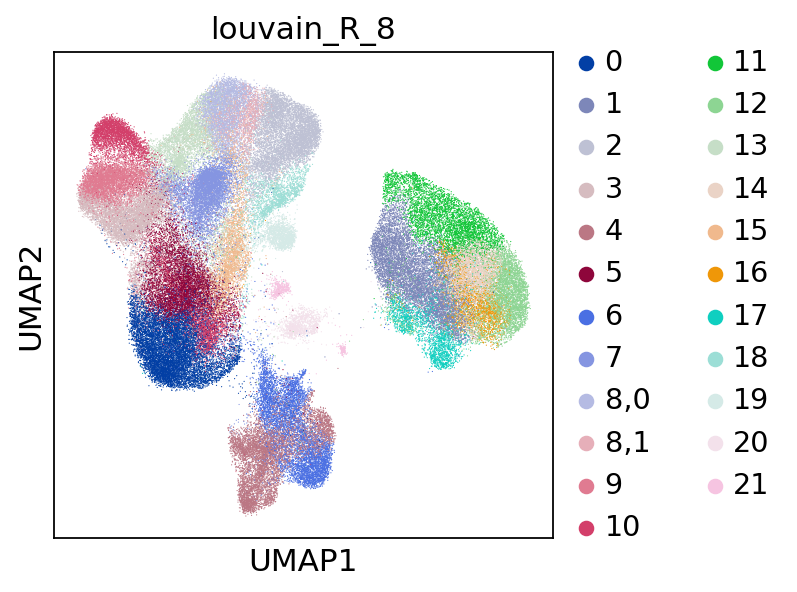

In [156]:
sc.pl.umap(adata, color=['louvain_R_8'])

In [157]:
# 8,0 - TEM_CD8
# 8,1 - TMRA_CD8

In [158]:
# zoom into cluster 13
sc.tl.louvain(adata, restrict_to=('louvain',['13']),
             key_added='louvain_R_13',
             resolution=0.3)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain_R_13', the cluster labels (adata.obs, categorical) (0:00:00)


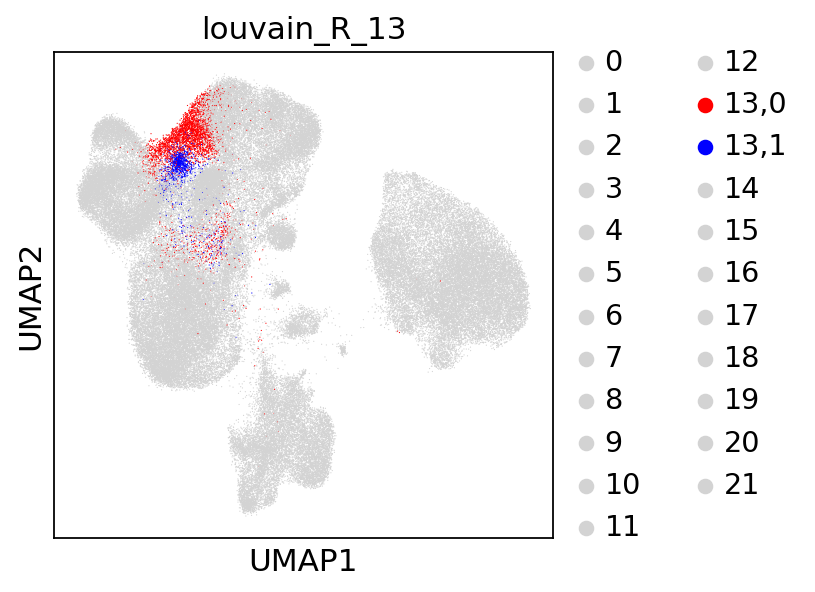

In [159]:
sc.pl.umap(adata, color=['louvain_R_13'],
          palette = ['lightgrey']*13 + ['red','blue'] + ['lightgrey']*8)

In [160]:
# 13,0 - TCM_CD8
# 13,1 - MAIT_cells

In [190]:
# zoom into cluster 10
sc.tl.louvain(adata, restrict_to=('louvain',['10']),
             key_added='louvain_R_10',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain_R_10', the cluster labels (adata.obs, categorical) (0:00:00)


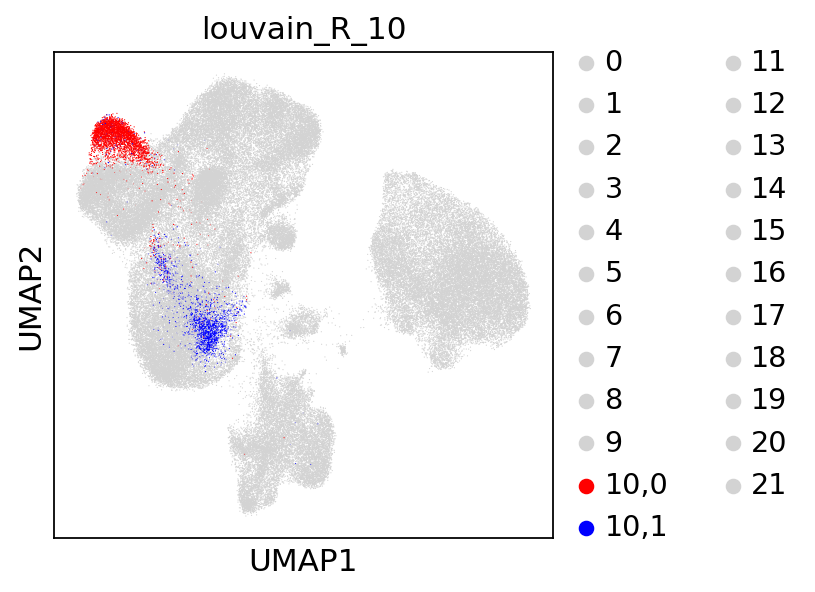

In [191]:
sc.pl.umap(adata, color=['louvain_R_10'], 
           #legend_loc='on data'
           palette=['lightgrey']*10 + ['red','blue',
                                       #'green',
           # 'yellow',,'lightblue','purple'
           ] + ['lightgrey']*11
          )

In [192]:
# zoom into cluster 10,1 a bit more
sc.tl.louvain(adata, restrict_to=('louvain_R_10',['10,1']),
             key_added='louvain_R_10,1',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain_R_10,1', the cluster labels (adata.obs, categorical) (0:00:00)


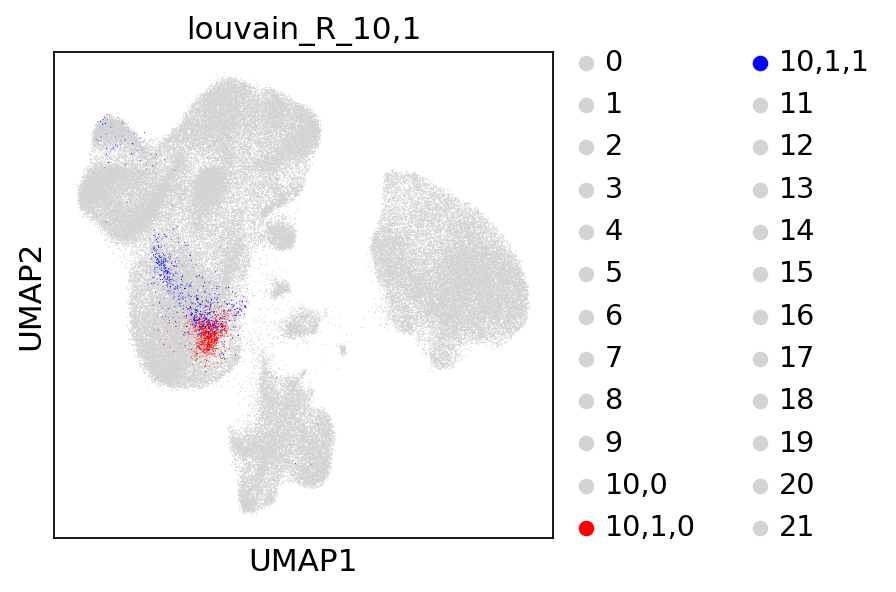

In [194]:
sc.pl.umap(adata, color=['louvain_R_10,1'], 
           #legend_loc='on data'
           palette=['lightgrey']*11 + ['red','blue',
                                       #'green',
           # 'yellow',,'lightblue','purple'
           ] + ['lightgrey']*11
          )

In [ ]:
# 10,0 - T8_naive
# 10,1,0 - T8_activated
# 10,1,1 - T_regs

In [164]:
# zoom into cluster 21
sc.tl.louvain(adata, restrict_to=('louvain',['21']),
             key_added='louvain_R_21',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain_R_21', the cluster labels (adata.obs, categorical) (0:00:00)


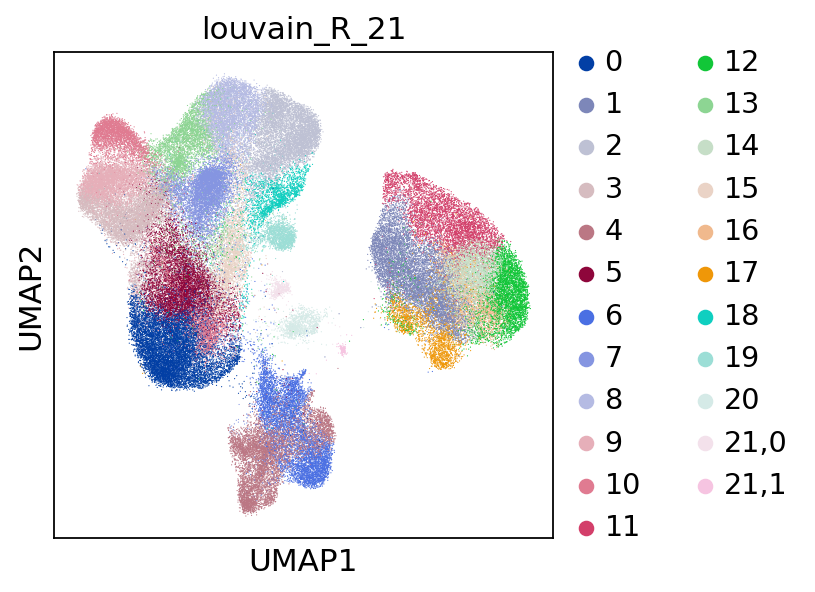

In [165]:
sc.pl.umap(adata, color=['louvain_R_21'],
           #legend_loc='on data'
           #palette=['lightgrey']*5 + ['red',
                    #'green','yellow','purple','blue','lightblue',
                    #'pink'
           #        ] + ['lightgrey']*18
          )

In [166]:
# 21,0 - precursor_cells
# 21,1 - pDC

In [167]:
# zoom into clusters 4 and 6 (B cells)
sc.tl.louvain(adata, restrict_to=('louvain',['4','6']),
             key_added='louvain_R_4_6',
             resolution=1.0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 29 clusters and added
    'louvain_R_4_6', the cluster labels (adata.obs, categorical) (0:00:01)


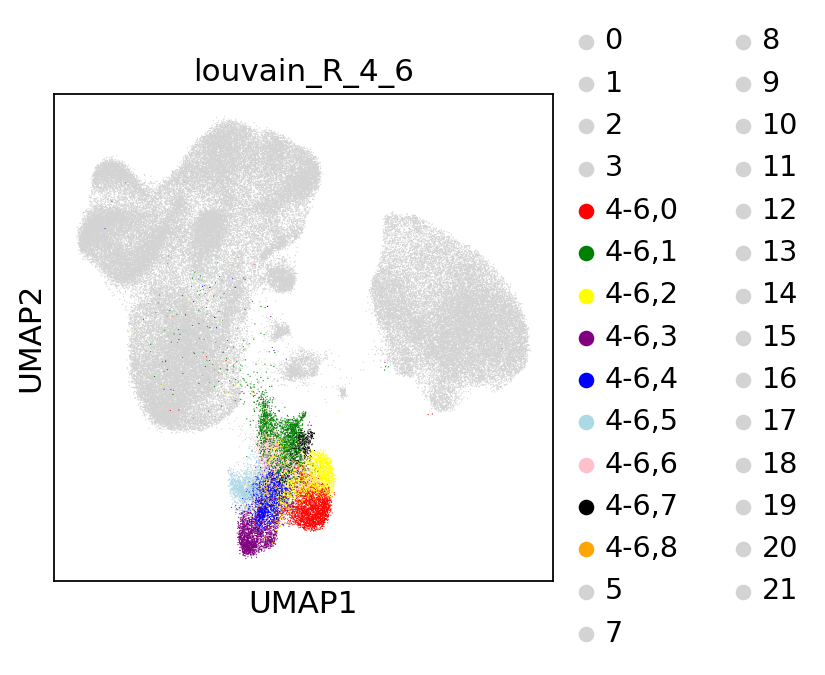

In [168]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*4 + ['red','green','yellow','purple','blue','lightblue','pink','black','orange'] + ['lightgrey']*16
          )

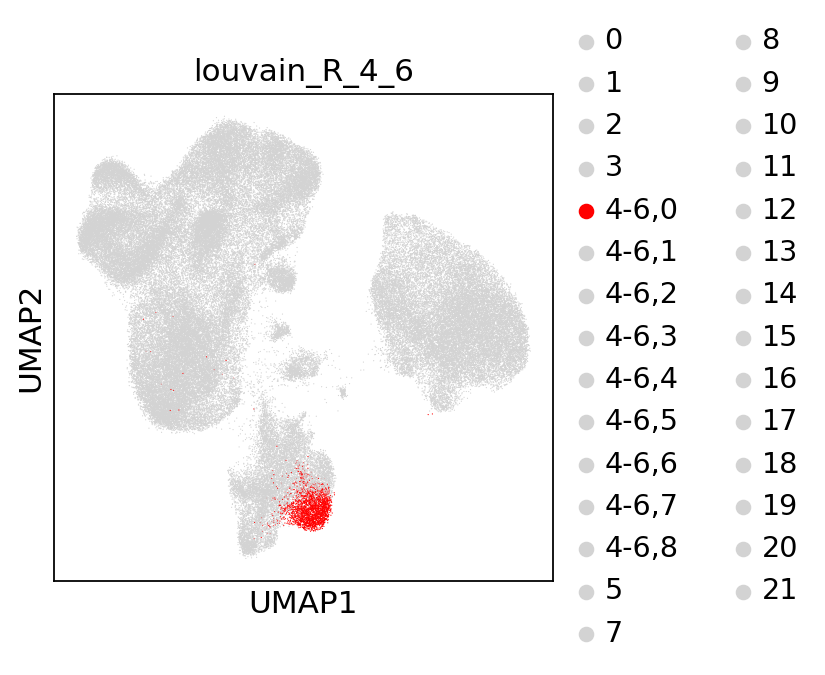

In [169]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*4 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*24
          )

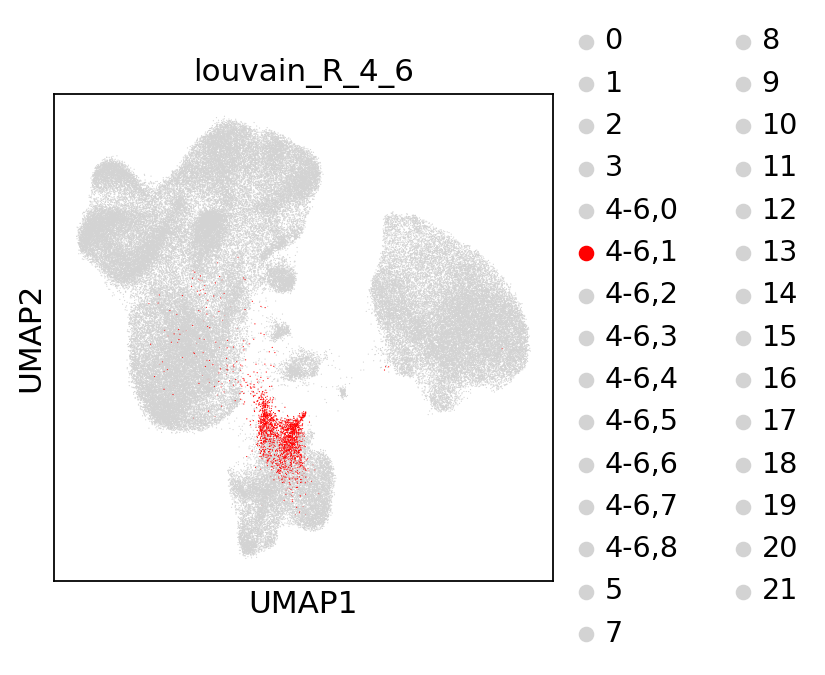

In [63]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*5 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*23
          )

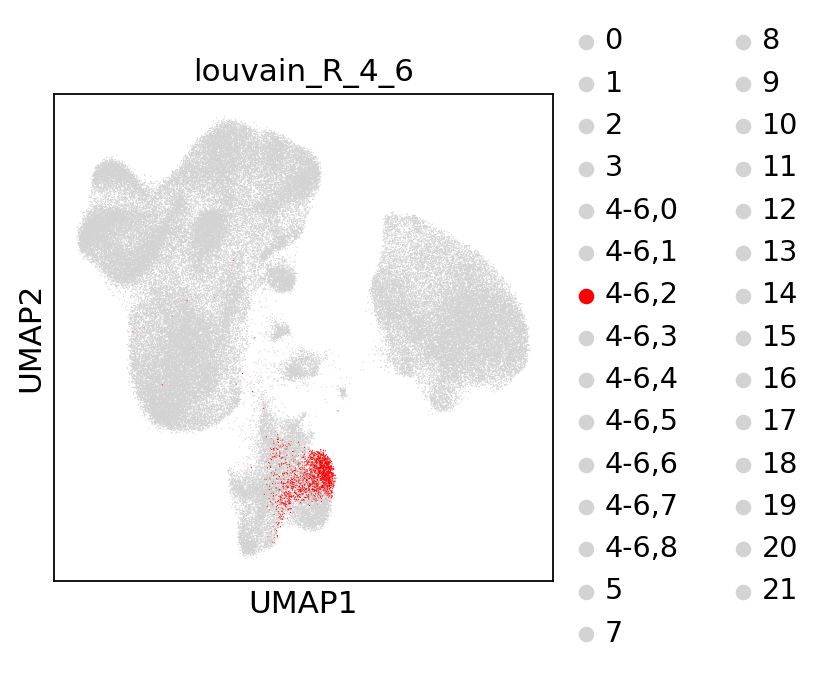

In [64]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*6 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*22
          )

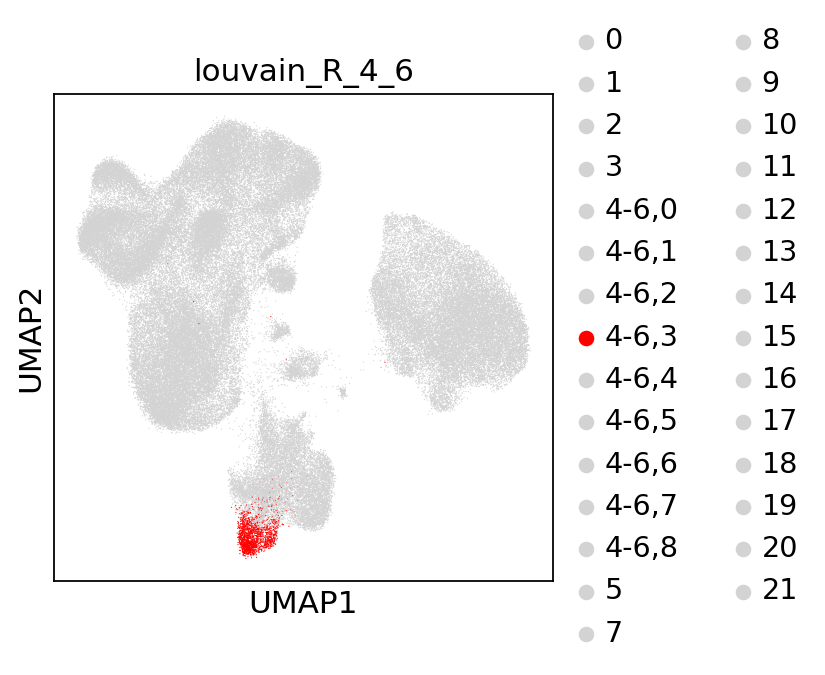

In [65]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*7 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*22
          )

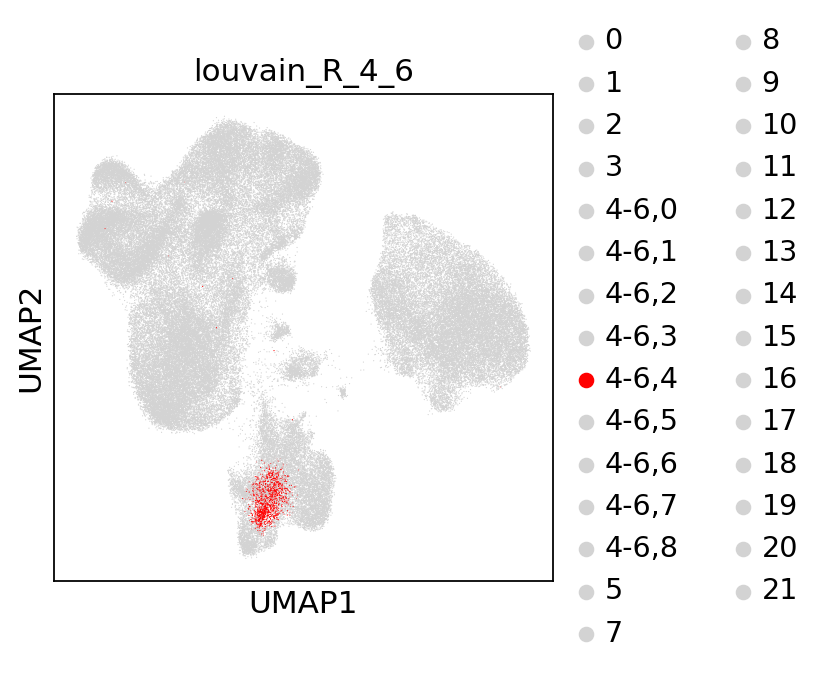

In [67]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*8 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*21
          )

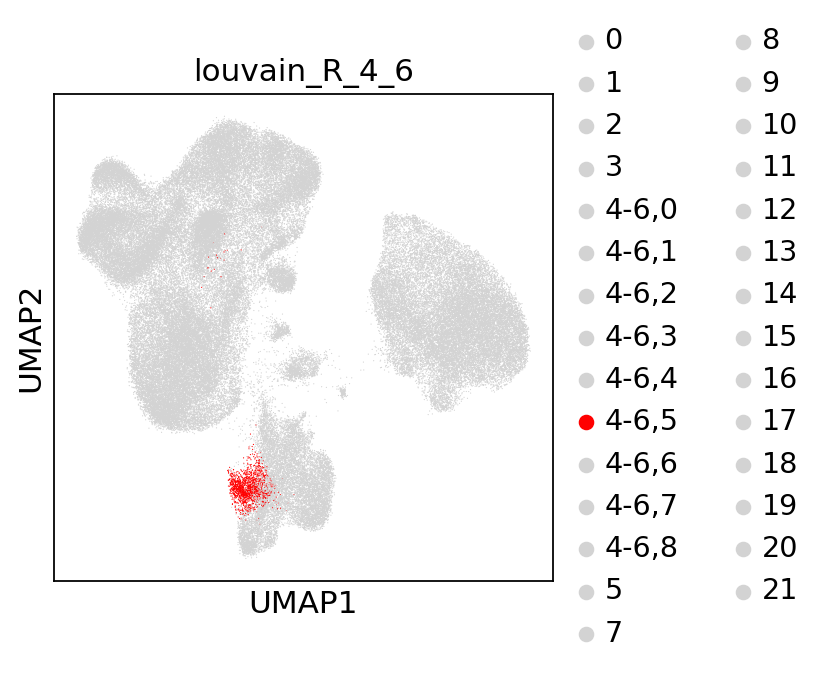

In [68]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*9 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*20
          )

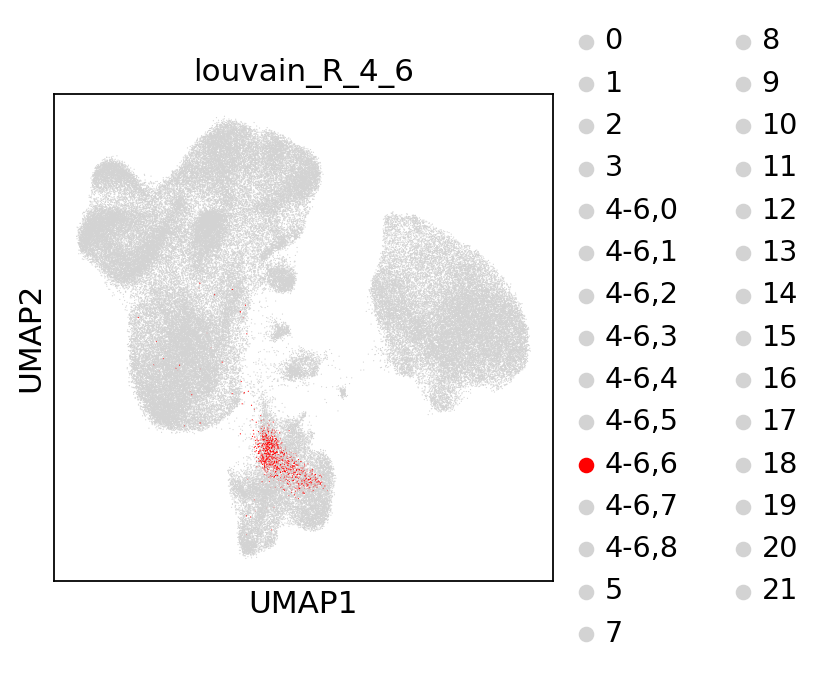

In [69]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*10 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*19
          )

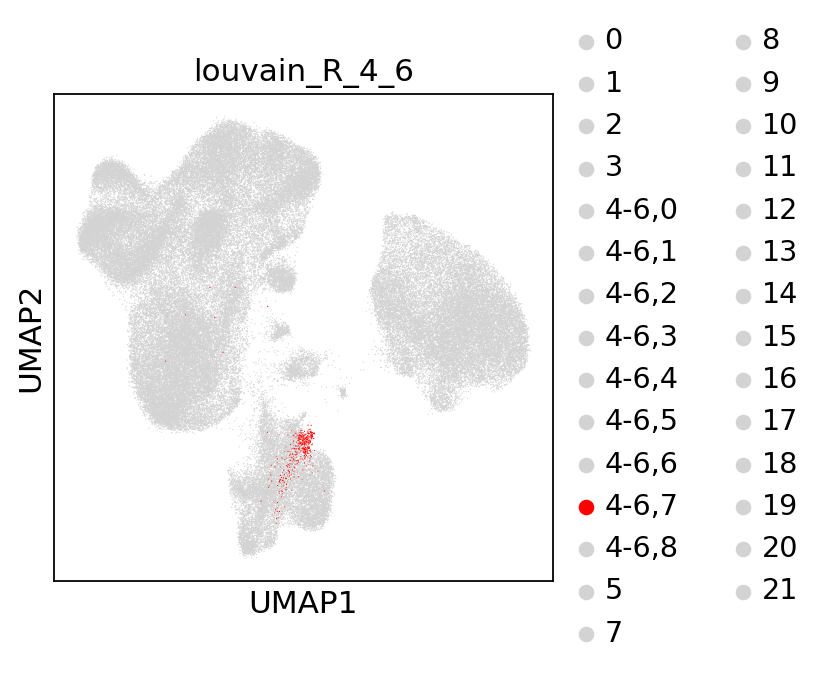

In [70]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*11 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*18
          )

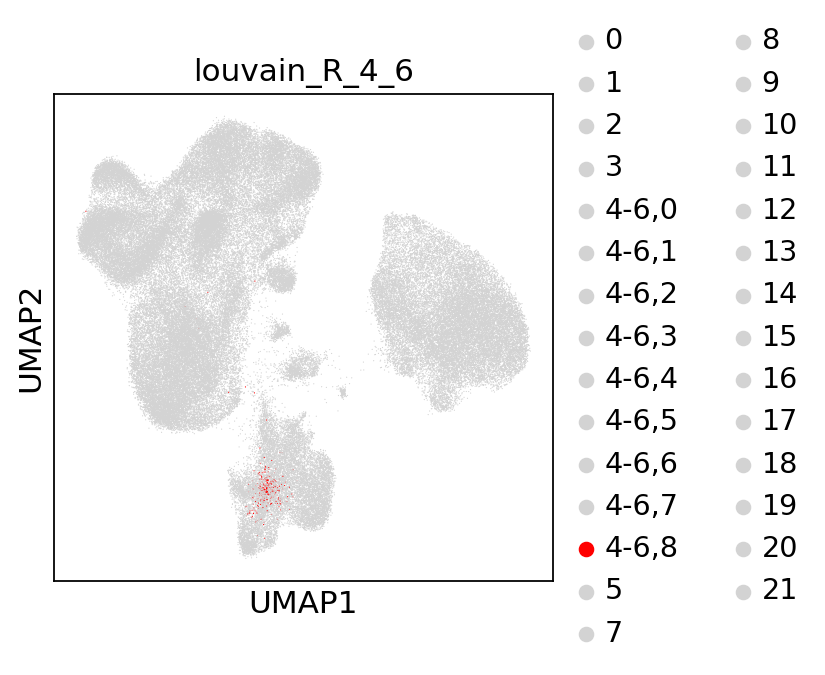

In [71]:
sc.pl.umap(adata, color=['louvain_R_4_6'],
           #legend_loc='on data'
           palette=['lightgrey']*12 + ['red',
                                      #'green','yellow','purple','blue','lightblue','pink','black','orange'
                                     ] + ['lightgrey']*17
          )

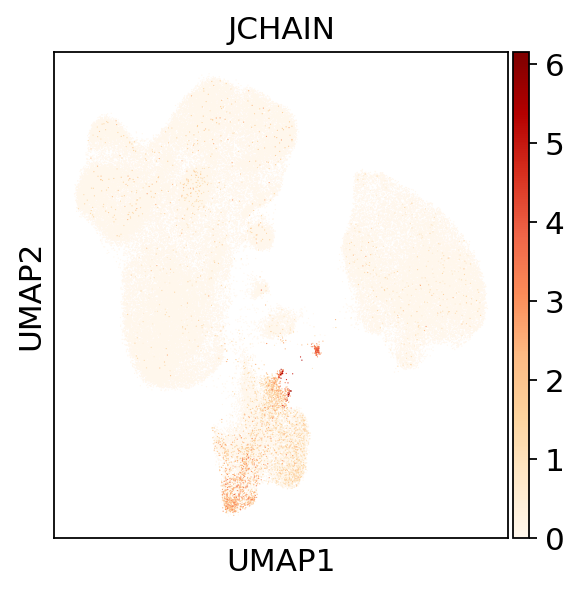

In [120]:
# plasma cells?
sc.pl.umap(adata, color=['JCHAIN'], cmap='OrRd', use_raw=True)

In [170]:
# zoom into clusters 4-6,1 and 4-6,7 - to catch Plasma cells
sc.tl.louvain(adata, restrict_to=('louvain_R_4_6',['4-6,1','4-6,7']),
             key_added='louvain_R_Plasma_cells',
             resolution=1.0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 33 clusters and added
    'louvain_R_Plasma_cells', the cluster labels (adata.obs, categorical) (0:00:00)


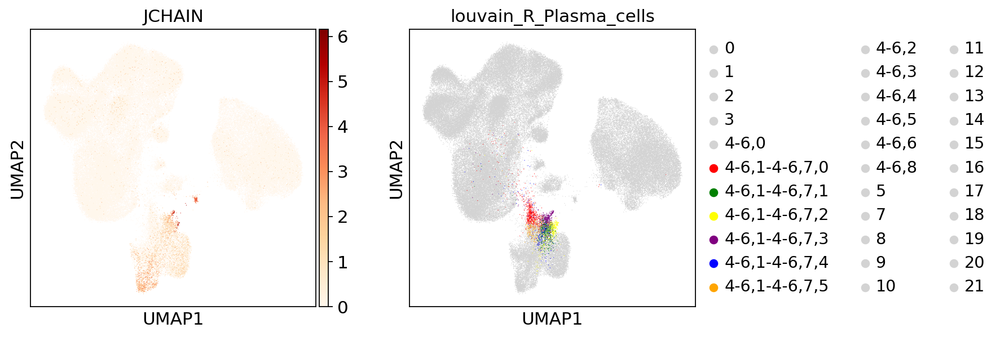

In [171]:
sc.pl.umap(adata, color=['JCHAIN', 'louvain_R_Plasma_cells'],
           #legend_loc='on data',
           cmap='OrRd', use_raw=True,
           palette=['lightgrey']*5 + ['red','green','yellow','purple','blue','orange',
           #'pink','black','orange'
           ] + ['lightgrey']*22
          )

In [172]:
# 4-6,1-4-6,7,3 and 4-6,1-4-6,7,2 - Plasma cells
# 4-6,1-4-6,7,0; 4-6,1-4-6,7,1; 4-6,1-4-6,7,4; 4-6,1-4-6,7,5 - B_cells_memory_activated

# 4-6,0; 4-6,2; 4-6,6 - B_cells_memory_activated
# 4-6,3 - B_cells_naive
# 4-6,4 - B-cells_memory
# 4-6,5 - B_cells_naive_activated
# 4-6,8 - B_cells_memory

In [173]:
# zoom into cluster 2
sc.tl.louvain(adata, restrict_to=('louvain',['2']),
             key_added='louvain_R_2',
             resolution=0.4)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain_R_2', the cluster labels (adata.obs, categorical) (0:00:01)


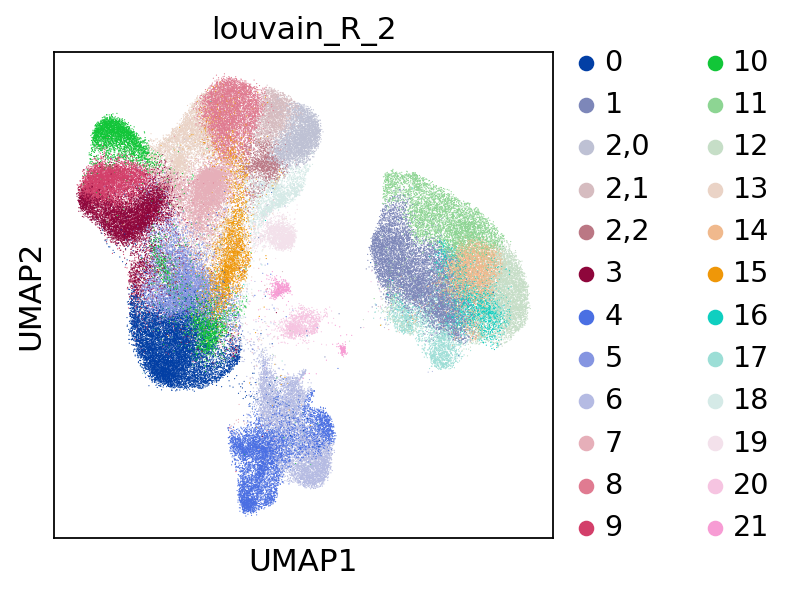

In [174]:
sc.pl.umap(adata, color=['louvain_R_2'])

In [175]:
# 2,2 - NK_CD16_bright_activated
# 2,0; 2,1 - NK_CD16_bright

In [176]:
# zoom into cluster 18
sc.tl.louvain(adata, restrict_to=('louvain',['18']),
             key_added='louvain_R_18',
             resolution=0.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain_R_18', the cluster labels (adata.obs, categorical) (0:00:00)


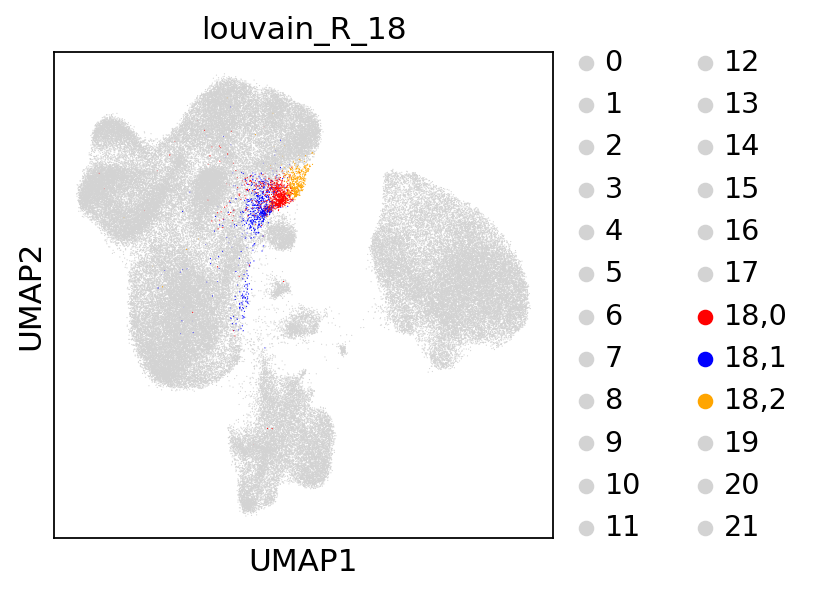

In [177]:
sc.pl.umap(adata, color=['louvain_R_18'], 
           #legend_loc='on data',
           palette=['lightgrey']*18 + ['red','blue','orange'] + ['lightgrey']*3
          )

In [178]:
# 18,0; 18,1 - NK_CD56_bright_activated
# 18,2 - NK_CD56_bright

# Labelling

Clusters with zoom ins:
- 8
- 13
- 10
- 21
- 4+6 (B cells)
- 2
- 18

In [179]:
np.unique(adata.obs['louvain'])

array(['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18',
       '19', '2', '20', '21', '3', '4', '5', '6', '7', '8', '9'],
      dtype=object)

In [180]:
0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21

(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21)

In [195]:
def annot_prelim(adata_obj, barcode):
    
    # coarse louvain labels
    
    curr_louvain_coarse = adata_obj.obs.loc[barcode,'louvain']
    
    if curr_louvain_coarse == '8':
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_8']
        # 8,0 - TEM_CD8
        # 8,1 - TMRA_CD8
        if zoomed_in_louvain == '8,0':
            return('TEM_CD8+')
        elif zoomed_in_louvain == '8,1':
            return('TMRA_CD8+')
        else:
            return('not_assigned_R_8')
        
    elif curr_louvain_coarse == '13':
        # 13,0 - TCM_CD8
        # 13,1 - MAIT_cells
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_13']
        if zoomed_in_louvain == '13,0':
            return('TCM_CD8+')
        elif zoomed_in_louvain == '13,1':
            return('MAIT_cells')
        else:
            return('not_assigned_R_13')
        

    elif curr_louvain_coarse == '10':
        # 10,0 - T8_naive
        # 10,1,0 - T8_activated
        # 10,1,1 - T_regs
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_10,1']
        if zoomed_in_louvain == '10,0':
            return('T8_naive')
        elif zoomed_in_louvain == '10,1,0':
            return('T8_activated')
        elif zoomed_in_louvain == '10,1,1':
            return('T_regs')
        else:
            return('not_assigned_R_10')
        
    elif curr_louvain_coarse == '21':
        # 21,0 - precursor_cells
        # 21,1 - pDC
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_21']
        if zoomed_in_louvain == '21,0':
            return('Precursor_cells')
        elif zoomed_in_louvain == '21,1':
            return('pDC')
        else:
            return('not_assigned_R_21')    
    
    elif curr_louvain_coarse in ['4','6']:
        # 4-6,1-4-6,7,3 and 4-6,1-4-6,7,2 - Plasma cells
        # 4-6,1-4-6,7,0; 4-6,1-4-6,7,1; 4-6,1-4-6,7,4; 4-6,1-4-6,7,5 - B_cells_memory_activated

        # 4-6,0; 4-6,2; 4-6,6 - B_cells_memory_activated
        # 4-6,3 - B_cells_naive
        # 4-6,4 - B_cells_memory
        # 4-6,5 - B_cells_naive_activated
        # 4-6,8 - B_cells_memory
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_Plasma_cells']
        if zoomed_in_louvain in ['4-6,1-4-6,7,2','4-6,1-4-6,7,3']:
            return('Plasma_cells')
        elif zoomed_in_louvain in ['4-6,1-4-6,7,0', '4-6,1-4-6,7,1', '4-6,1-4-6,7,4', '4-6,1-4-6,7,5',
                                  '4-6,0', '4-6,2', '4-6,6']:
            return('B_cells_memory_activated')
        elif zoomed_in_louvain == '4-6,3':
            return('B_cells_naive')
        elif zoomed_in_louvain in ['4-6,4','4-6,8']:
            return('B_cells_memory')
        elif zoomed_in_louvain == '4-6,5':
            return('B_cells_naive_activated')
        else:
            return('not_assigned_R_4_6_cluster_' + zoomed_in_louvain)
        
        
    elif curr_louvain_coarse == '2':
        # 2,2 - NK_CD16_bright_activated
        # 2,0; 2,1 - NK_CD16_bright
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_2']
        if zoomed_in_louvain == '2,2':
            return('NK_CD16_bright_activated')
        elif zoomed_in_louvain in ['2,0','2,1']:
            return('NK_CD16_bright')
        else:
            return('not_assigned_R_2')    
    
    elif curr_louvain_coarse == '18':
        # 18,0; 18,1 - NK_CD56_bright_activated
        # 18,2 - NK_CD56_bright
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_18']
        if zoomed_in_louvain == '18,2':
            return('NK_CD56_bright')
        elif zoomed_in_louvain in ['18,0','18,1']:
            return('NK_CD56_bright_activated')
        else:
            return('not_assigned_R_18')
    
    
        
    # 7 - iNKT_cells
    # 9 - T4_naive
    # 3 - T4_memory
    # 19 - T_gd
    # 20 - cDC1
    # 15 - T8_activated
    # 0 - T4_activated
    # 5 - T_regs
    # 11 - Macrophages
    # 1 - cDC1
    # 12 - Monocytes_intermediate
    # 14, 16 - Monocytes_classical
    # 17 - Monocytes_non-classical
        
    elif curr_louvain_coarse == '7':
        return('iNKT_cells')
    elif curr_louvain_coarse == '9':
        return('T4_naive')
    elif curr_louvain_coarse == '3':
        return('T4_memory')
    elif curr_louvain_coarse == '19':
        return('T_gd')

    elif curr_louvain_coarse == '20':
        return('cDC2')
    elif curr_louvain_coarse == '15':
        return('T8_activated')
    elif curr_louvain_coarse == '0':
        return('T4_activated')
    
    elif curr_louvain_coarse == '5':
        return('T_regs')
    
    elif curr_louvain_coarse == '11':
        return('Macrophages')
    
    elif curr_louvain_coarse == '1':
        return('cDC1')

    elif curr_louvain_coarse == '12':
        return('Monocytes_intermediate')
    elif curr_louvain_coarse in ['14','16']:
        return('Monocytes_classical')
    
    elif curr_louvain_coarse == '17':
        return('Monocytes_non-classical')
    
    else:
        return('not_assigned')
    

In [196]:
adata.obs['barcode'] = adata.obs.index

In [197]:
adata.obs['cell_type'] = adata.obs['barcode'].apply(lambda x: annot_prelim(adata,x))

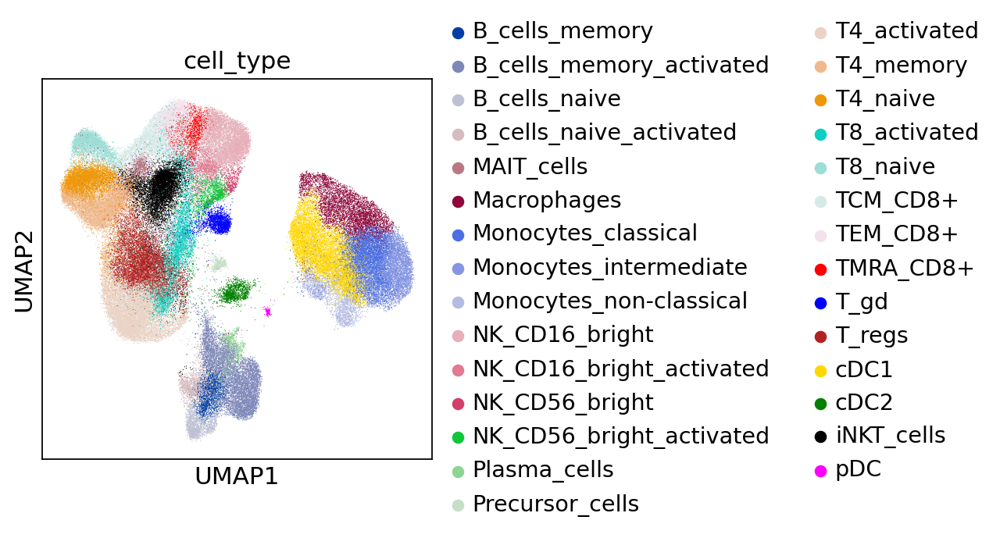

In [199]:
sc.pl.umap(adata, color='cell_type', 
           #palette=['#023fa5','#7d87b9','#bec1d4','#d6bcc0','#bb7784','#8e063b',
           #          '#4a6fe3','#8595e1','#b5bbe3','#e6afb9','#e07b91','#d33f6a','#11c638',
           #          '#8dd593','#c6dec7','#ead3c6','#f0b98d','#ef9708','#0fcfc0','#9cded6','#d5eae7','#f3e1eb',
           #          'red','blue','firebrick','gold','green','black','magenta']
          )

In [202]:
adata.obs.loc[:,['cell_id', 'cell_type']].to_csv(save_path + 'annotation_GEX_and_SoupX_denoised_protein_20210217.csv')

In [72]:
sc.settings.set_figure_params(dpi=80,
                             figsize=[10,10])  # low dpi (dots per inch) yields small inline figures

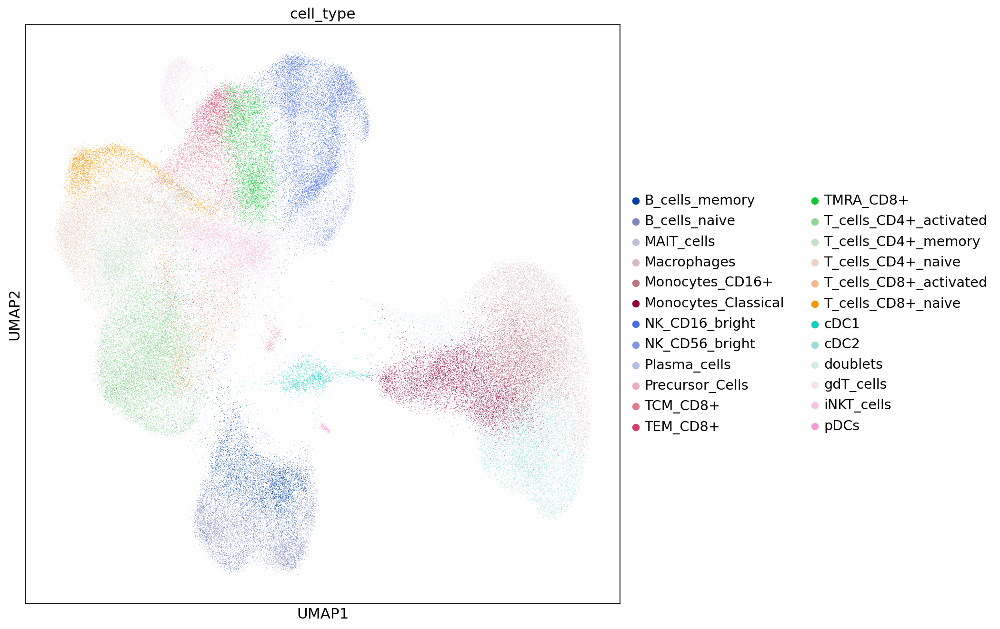

In [73]:
sc.pl.umap(adata, color='cell_type')

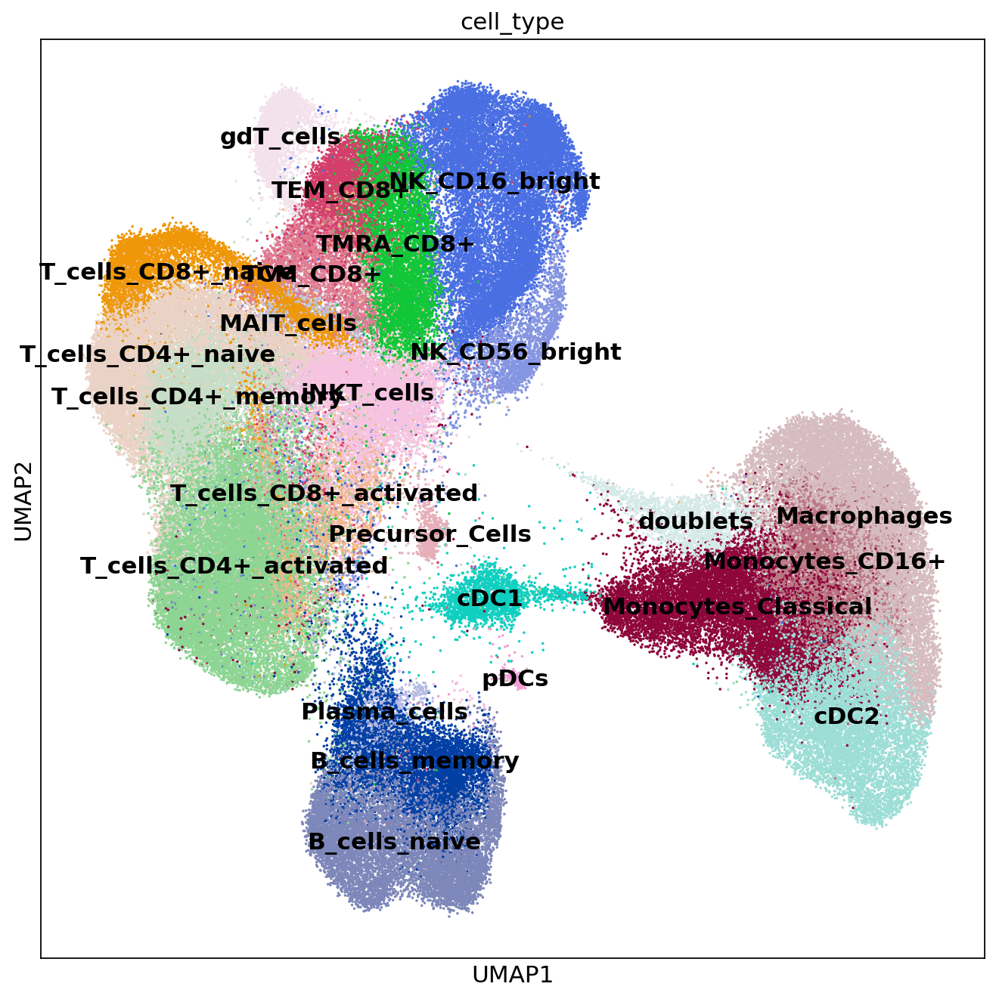

In [74]:
sc.pl.umap(adata, color='cell_type', legend_loc='on data', legend_fontweight='bold',
          size=10)

In [78]:
# also adding labels of doublets by BCR and doublets by TCR
doublets_BCR = pd.read_csv(save_path + 'doublets_by_BCR_table_20210106.csv', index_col=0)
doublets_TCR = pd.read_csv(save_path + 'doublets_by_TCR_table_20210106.csv', index_col=0)

In [80]:
doublets_BCR.shape

(163320, 1)

In [81]:
doublets_TCR.shape

(163320, 1)

In [82]:
np.unique(doublets_BCR['doublets_by_BCR'], return_counts=True)

(array([False,  True]), array([160951,   2369]))

In [83]:
np.unique(doublets_TCR['doublets_by_TCR'], return_counts=True)

(array([False,  True]), array([149897,  13423]))

In [84]:
def add_BCR_TCR_doublet_labels(adata_obj, barcode):
    
    curr_cell_type = adata_obj.obs.loc[barcode, 'cell_type']
    
    # priority to doublets by BCR over those by TCR but it's not important anyway, they are going to be excluded
    if doublets_BCR.loc[barcode, 'doublets_by_BCR']:
        return('doublets_by_BCR')
    elif doublets_TCR.loc[barcode, 'doublets_by_TCR']:
        return('doublets_by_TCR')
    else:
        return(curr_cell_type)

In [87]:
adata.obs['cell_type_final'] = adata.obs['barcode'].apply(lambda x: add_BCR_TCR_doublet_labels(adata, x))

... storing 'cell_type_final' as categorical


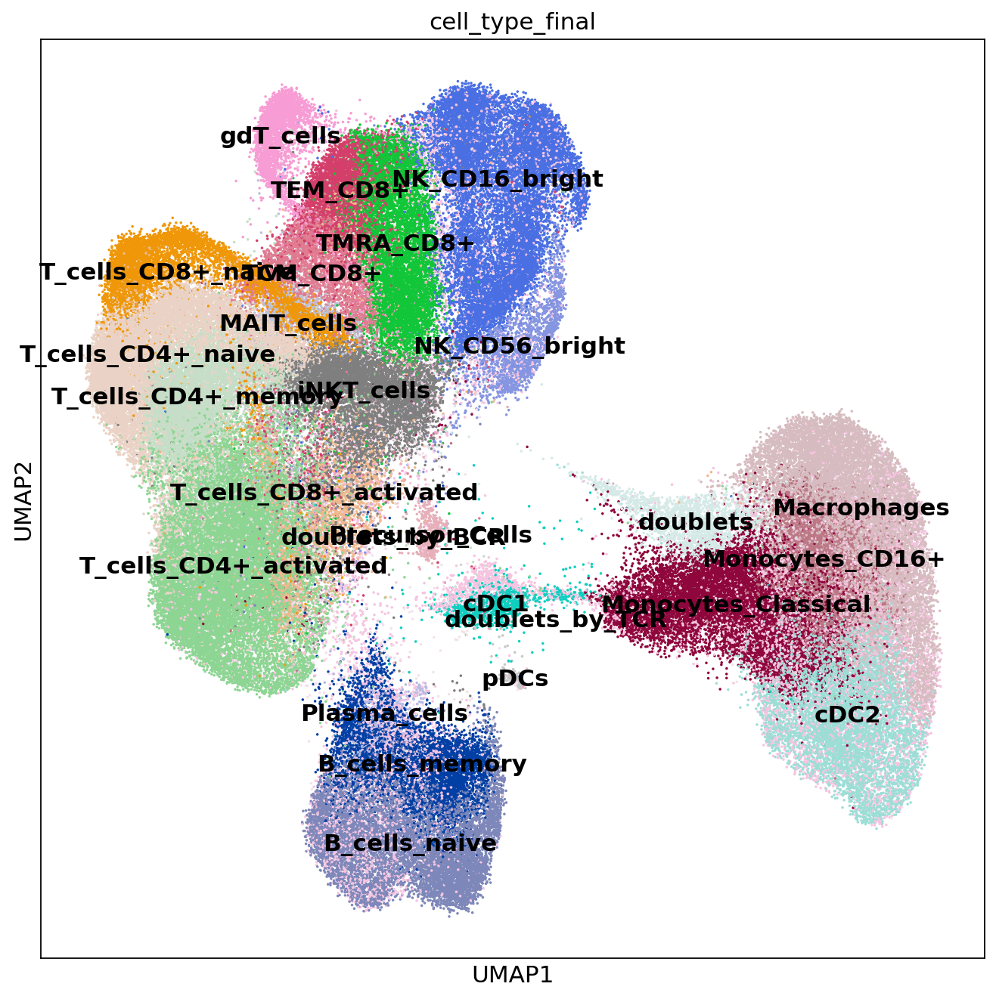

In [88]:
sc.pl.umap(adata, color='cell_type_final', legend_loc='on data', legend_fontweight='bold',
          size=10)

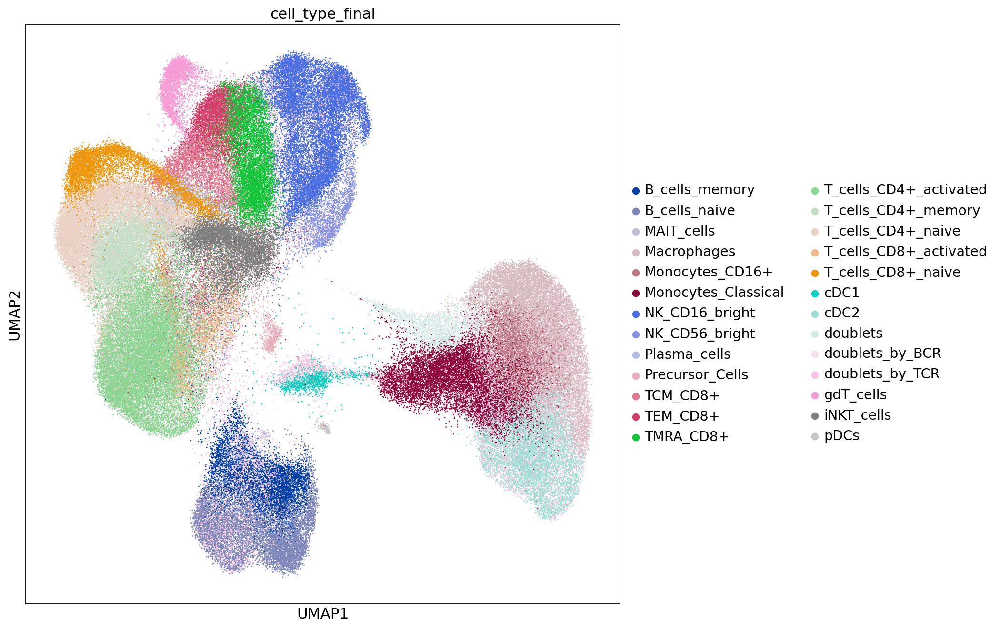

In [92]:
sc.pl.umap(adata, color='cell_type_final', 
           #legend_loc='on data', legend_fontweight='bold',
          size=6
          )

In [94]:
annot_table = adata.obs.loc[:,['cell_type_final']]

In [95]:
annot_table.head()

,cell_type_final
AAACCTGAGAATGTGT-1,Monocytes_CD16+
AAACCTGAGACTAAGT-1,cDC2
AAACCTGAGCCGCCTA-1,TCM_CD8+
AAACCTGAGCGCCTCA-1,TEM_CD8+
AAACCTGAGGATGTAT-1,TEM_CD8+


In [97]:
np.unique(annot_table['cell_type_final'])

array(['B_cells_memory', 'B_cells_naive', 'MAIT_cells', 'Macrophages',
       'Monocytes_CD16+', 'Monocytes_Classical', 'NK_CD16_bright',
       'NK_CD56_bright', 'Plasma_cells', 'Precursor_Cells', 'TCM_CD8+',
       'TEM_CD8+', 'TMRA_CD8+', 'T_cells_CD4+_activated',
       'T_cells_CD4+_memory', 'T_cells_CD4+_naive',
       'T_cells_CD8+_activated', 'T_cells_CD8+_naive', 'cDC1', 'cDC2',
       'doublets', 'doublets_by_BCR', 'doublets_by_TCR', 'gdT_cells',
       'iNKT_cells', 'pDCs'], dtype=object)

In [98]:
annot_table.to_csv(save_path + 'annotation_of_adata_hvg_BBKNN_GEX_and_SoupX_denoised_protein_all_samples_20210108.csv')

--> to notebok M2-2a

# DE with limma

In [128]:
# creating also the full object (all genes) - only normalised and log transformed
adata_all_full = anndata.AnnData(X=adata.raw.X,
                            obs=adata.obs,
                            var=adata.raw.var,
                            obsm=adata.obsm)

In [129]:
np.unique(adata_all_full.obs['annot'])

array(['B_cells', 'Class_Monocytes', 'Interm_Monocytes', 'MAIT_cells',
       'NKT_cells', 'NK_CD56_bright', 'NK_CD56_bright_activated',
       'NK_CD56_dim', 'NK_CD56_dim_activated', 'Non-class_Monocytes',
       'Plasma_cells', 'Precursor_cells', 'T4_memory',
       'T4_memory_activated', 'T4_naive', 'T4_naive_activated',
       'T8_memory', 'T8_memory_activated', 'T8_naive',
       'T8_naive_activated', 'cDC', 'gdT_cells', 'not_assigned_R_1'],
      dtype=object)

In [131]:
# want to have a look at CD4+ T cell compartment
adata_CD4_T = adata_all_full[adata_all_full.obs['annot'].isin(['T4_memory',
       'T4_memory_activated', 'T4_naive', 'T4_naive_activated'])]

In [132]:
adata_CD4_T

View of AnnData object with n_obs × n_vars = 24660 × 20209
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor_ID_temp', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'prelim_annot', 'probabilities', 'celltype_predictions', 'barcode', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status', 'louvain_R_1', 'louvain_R_5', 'louvain_R_7', 'louvain_R_17', 'louvain_R_3', 'louvain_R_3,4', 'annot'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature

In [133]:
# marker calling

#t = adata_hvg.X.toarray().T
t = adata_CD4_T.X.toarray().T
df = pd.DataFrame(data=t, columns= adata_CD4_T.obs.index, index=adata_CD4_T.var_names)

meta_df = pd.DataFrame(data={'Cell':list(adata_CD4_T.obs.index),
                             'cell_type':[ str(i) for i in adata_CD4_T.obs['CVID_status']],
                             'sample':[ str(i) for i in adata_CD4_T.obs['sample']]})
meta_df.set_index('Cell', inplace=True)

In [134]:
meta_df

,cell_type,sample
Cell,,
AAACCTGAGGCTAGCA-1,CONTROL,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGAGTACTTGC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGAGTTCGATC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGCACCAGTTA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
AAACCTGCACGACGAA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
...,...,...
TTTGGTTTCTTGTCAT-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
TTTGTCAAGGCCCGTT-1,CVID,35008_CV005_RV9039265_and_35008_CV005_RV9039289
TTTGTCAAGTACGATA-1-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289


In [135]:
np.unique(meta_df['cell_type'], return_counts=True)

(array(['CONTROL', 'CVID'], dtype=object), array([14277, 10383]))

In [136]:
%load_ext rpy2.ipython

In [137]:
outpath = './10X_B_cells_DE_limma/'

In [138]:
%%R
library(limma)
library(edgeR)

In [139]:
meta_df.reset_index(inplace=True)

In [140]:
meta_df

,Cell,cell_type,sample
0,AAACCTGAGGCTAGCA-1,CONTROL,35008_CV005_RV9039258_and_35008_CV005_RV9039282
1,AAACCTGAGTACTTGC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
2,AAACCTGAGTTCGATC-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
3,AAACCTGCACCAGTTA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
4,AAACCTGCACGACGAA-1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
...,...,...,...
24655,TTTGGTTTCTTGTCAT-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24656,TTTGTCAAGGCCCGTT-1,CVID,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24657,TTTGTCAAGTACGATA-1-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24658,TTTGTCAGTCTTCTCG-1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289


In [141]:
# because R replace '-' with '.' in df for some reason
def rename_Cell(cell_id):
    return(cell_id.replace('-','.'))

In [142]:
meta_df['Cell'] = meta_df['Cell'].apply(lambda x: rename_Cell(x))

In [143]:
meta_df

,Cell,cell_type,sample
0,AAACCTGAGGCTAGCA.1,CONTROL,35008_CV005_RV9039258_and_35008_CV005_RV9039282
1,AAACCTGAGTACTTGC.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
2,AAACCTGAGTTCGATC.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
3,AAACCTGCACCAGTTA.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
4,AAACCTGCACGACGAA.1,CVID,35008_CV005_RV9039258_and_35008_CV005_RV9039282
...,...,...,...
24655,TTTGGTTTCTTGTCAT.1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24656,TTTGTCAAGGCCCGTT.1,CVID,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24657,TTTGTCAAGTACGATA.1.1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289
24658,TTTGTCAGTCTTCTCG.1,CONTROL,35008_CV005_RV9039265_and_35008_CV005_RV9039289


In [144]:
df

index,AAACCTGAGGCTAGCA-1,AAACCTGAGTACTTGC-1,AAACCTGAGTTCGATC-1,AAACCTGCACCAGTTA-1,AAACCTGCACGACGAA-1,AAACCTGTCAATACCG-1,AAACGGGAGAACTGTA-1,AAACGGGTCGGTCCGA-1,AAACGGGTCTTTAGTC-1,AAAGATGAGGTGGGTT-1,...,TTTGGTTCAGCCTATA-1,TTTGGTTCAGTTCATG-1,TTTGGTTGTAGCAAAT-1-1,TTTGGTTGTGAAATCA-1,TTTGGTTTCCGCATAA-1,TTTGGTTTCTTGTCAT-1,TTTGTCAAGGCCCGTT-1,TTTGTCAAGTACGATA-1-1,TTTGTCAGTCTTCTCG-1,TTTGTCATCGCTGATA-1
index,,,,,,,,,,,,,,,,,,,,,
RP11-34P13.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FO538757.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AP006222.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP4-669L17.10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP5-857K21.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC091133.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TENM2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP11-22A3.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [145]:
np.unique(meta_df['cell_type'], return_counts=True)

(array(['CONTROL', 'CVID'], dtype=object), array([14277, 10383]))

In [146]:
# doing for all nonCVID B cells, comparing GC-like B cells vs other B cells
case = 'CVID'
ctrl = 'CONTROL'

In [147]:
%%R -i df -i meta_df -i outpath -i ctrl -i case 

library(limma)
library(edgeR)

# Format
ex_mat=as.matrix(df)
rownames(meta_df) = meta_df$Cell

# subset meta
meta_df = subset(meta_df, cell_type %in% unlist(c(ctrl, case)) )
print(unique(meta_df$cell_type))

# Shared cells
shared_cells = intersect(rownames(meta_df), colnames(ex_mat))
message(length(shared_cells), ' shared cells')
ex_mat = ex_mat[, shared_cells]
meta_df = meta_df[shared_cells,]

# Filter lowly expressed genes
keep = rowSums(ex_mat, na.rm=T) > 0.1
ex_mat = ex_mat[ keep, ]
keep = aveLogCPM(ex_mat) > 0.1
ex_mat = ex_mat[ keep, ]

# Extract celltypes
cells = rownames(meta_df)
celltypes = unique(meta_df$cell_type)
covariates = meta_df$covariate

# Extract cells in cluster and rest
cells_case = rownames(subset(meta_df, cell_type == case))
cells_ctrl = rownames(subset(meta_df, cell_type == ctrl)) # changed from control to ctrl

# build cluster_type vector
cluster_type = rep(0, length(cells))
names(cluster_type) = cells
cluster_type[ cells_case ] = 'case'
cluster_type[ cells_ctrl ] = 'ctrl'

print(unique(cluster_type))

#design.matrix <- model.matrix(~ 0 + cluster_type + covariates)
design.matrix <- model.matrix(~ 0 + cluster_type)

# Now tell limma how do you want to compare (i.e. case vs control)
contrast.matrix <- makeContrasts(caseVScontrol = cluster_typecase - cluster_typectrl, levels = design.matrix)

# Make model and run contrasts
fit <- lmFit(ex_mat, design.matrix)
fit <- contrasts.fit(fit, contrast.matrix)
fit <- eBayes(fit)

# Make a dataframe containing the important data
results = topTable(fit, adjust="fdr", number = nrow(ex_mat), coef = 'caseVScontrol')

# Add and filter needed data
results$Gene = rownames(results)
results = results[ , c('Gene', 'logFC', 'P.Value', 'adj.P.Val')]
results$AveExpr_cluster = apply(ex_mat[ results$Gene, cells_case], 1, mean)
results$AveExpr_rest = apply(ex_mat[ results$Gene, cells_ctrl], 1, mean)
results$percentExpr_cluster = apply(ex_mat[ results$Gene, cells_case], 1, function(x) sum(c(x > 0)+0) ) / length(cells_case)
results$percentExpr_rest = apply(ex_mat[ results$Gene, cells_ctrl], 1, function(x) sum(c(x > 0)+0) ) / length(cells_ctrl)

results$AveExpr_cluster = round(results$AveExpr_cluster, 6)
results$AveExpr_rest = round(results$AveExpr_rest, 6)
results$percentExpr_cluster = round(results$percentExpr_cluster, 6)
results$percentExpr_rest = round(results$percentExpr_rest, 6)
# and store it as csv file
write.csv(results, file = paste0(outpath, case, '_vs_', ctrl, '_CD4_T_cells_limma_DEGs.csv'), row.names = F, col.names = T, quote = F)

[1] "CONTROL" "CVID"   


R[write to console]: 24660 shared cells



[1] "ctrl" "case"


In [148]:
DE_table = pd.read_csv('./10X_B_cells_DE_limma/CVID_vs_CONTROL_CD4_T_cells_limma_DEGs.csv', index_col=0)

In [151]:
for gene in DE_table.index:
    if 'CD40' in gene:
        print(gene)

CD40LG
CD40-1
CD40


In [152]:
DE_table.loc['CD40LG']

logFC                 -6.672630e-02
P.Value                3.208165e-15
adj.P.Val              4.016276e-13
AveExpr_cluster        2.488950e-01
AveExpr_rest           3.156220e-01
percentExpr_cluster    1.577580e-01
percentExpr_rest       1.958390e-01
Name: CD40LG, dtype: float64

In [154]:
adata_CD4_T

View of AnnData object with n_obs × n_vars = 24660 × 20209
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor_ID_temp', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'prelim_annot', 'probabilities', 'celltype_predictions', 'barcode', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status', 'louvain_R_1', 'louvain_R_5', 'louvain_R_7', 'louvain_R_17', 'louvain_R_3', 'louvain_R_3,4', 'annot'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature

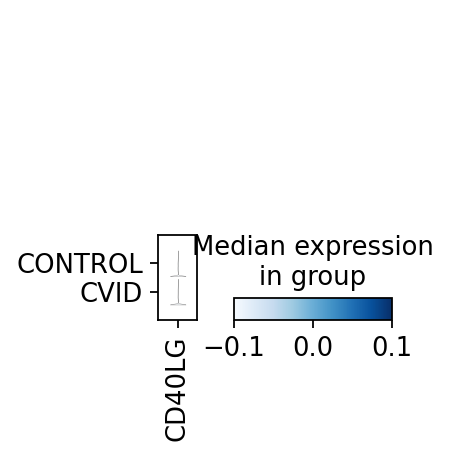

In [155]:
sc.pl.stacked_violin(adata_CD4_T, 
                         ['CD40LG'],
                         groupby = 'CVID_status',
                    save='_CD4_T_cells_violin_plot.pdf')

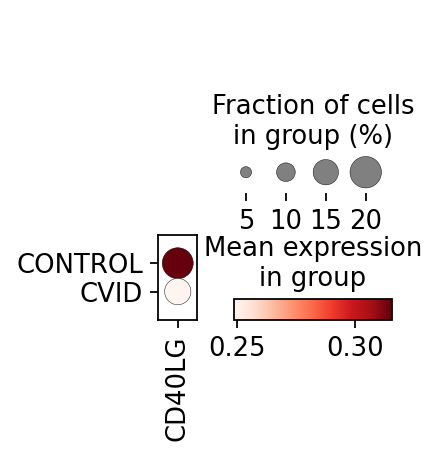

In [156]:
sc.pl.dotplot(adata_CD4_T, 
                         ['CD40LG'],
                         groupby = 'CVID_status',
                    save='_CD4_T_cells.pdf')

Trying to set attribute `.uns` of view, copying.


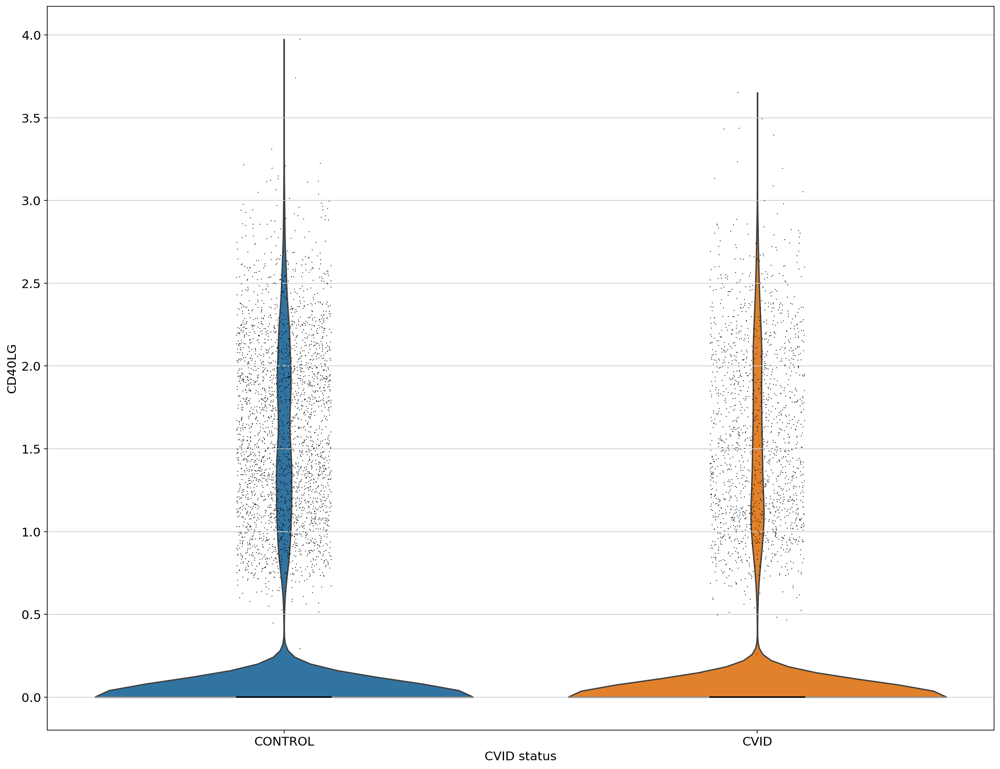

In [157]:
sc.pl.violin(adata_CD4_T, 
                         ['CD40LG'],
                         groupby = 'CVID_status',
                    save='_CD4_T_cells.pdf')

In [153]:
DE_table

,logFC,P.Value,adj.P.Val,AveExpr_cluster,AveExpr_rest,percentExpr_cluster,percentExpr_rest
Gene,,,,,,,
RPS4Y1,6.406594e-01,0.000000e+00,0.000000e+00,1.493042,0.852383,0.678609,0.407018
MT2A,-3.728604e-01,3.539666e-108,3.279147e-104,0.940054,1.312915,0.428585,0.512433
XIST,-8.877900e-02,1.751247e-101,1.081570e-97,0.010996,0.099775,0.007416,0.066471
MT1E,-1.889162e-01,9.035516e-96,4.185251e-92,0.237521,0.426437,0.155543,0.255446
RPS26,-3.226608e-01,1.854109e-93,6.870586e-90,2.530541,2.853202,0.819127,0.892274
...,...,...,...,...,...,...,...
ZNF837,-3.682926e-07,9.996968e-01,9.999109e-01,0.003428,0.003428,0.002504,0.002171
TTF1,-1.162249e-06,9.998228e-01,9.999109e-01,0.104146,0.104148,0.068381,0.072774
RIMS3,1.123980e-07,9.998713e-01,9.999109e-01,0.001879,0.001879,0.001348,0.001401


In [ ]:
# if not, try to only compare only activated T cell states

In [90]:
# to get the barcode-sample column stored here as 'cell_id'
adata_raw_filtered = sc.read(save_path+'adata_raw_filtered.h5ad')

In [91]:
adata.obs['barcode_sample'] = adata_raw_filtered.obs.loc[adata.obs.index,'cell_id']

In [95]:
adata.obs['prelim_annot']

index
AAACCTGAGAATGTGT-1      Monocyte-derived_cells
AAACCTGAGACTAAGT-1                         DCs
AAACCTGAGCCGCCTA-1                  MAIT_cells
AAACCTGAGCGCCTCA-1                   T8_memory
AAACCTGAGGATGTAT-1                   T8_memory
                                 ...          
TTTGTCATCATCGATG-1      Monocyte-derived_cells
TTTGTCATCATCGCTC-1                         NK1
TTTGTCATCCTTAATC-1                         NK1
TTTGTCATCGCTGATA-1                    T8_naive
TTTGTCATCTAACTCT-1-1                 Monocytes
Name: prelim_annot, Length: 92749, dtype: category
Categories (21, object): [B_cells, DCs, MAIT_cells, Monocyte-derived_cells, ..., T8_memory, T8_naive, T8_naive_activated, gdT]

In [99]:
for sample in np.unique(adata.obs['sample']):
    print(sample)
    curr_data = adata[adata.obs['sample'] == sample]
    annot_df = pd.DataFrame(index=curr_data.obs['barcode_sample'])
    annot_df['cell_type'] = list(curr_data.obs['prelim_annot'])
    annot_df.index = [elem.split('_')[0] for elem in annot_df.index]
    print(annot_df)
    annot_df.to_csv('./annot_tables_for_SoupX/20201008_prelim_annot_8_samples_annot_sample_'+sample+'.csv')

35008_CV005_RV9039258_and_35008_CV005_RV9039282
                                 cell_type
AAACCTGAGAATGTGT-1  Monocyte-derived_cells
AAACCTGAGACTAAGT-1                     DCs
AAACCTGAGCCGCCTA-1              MAIT_cells
AAACCTGAGCGCCTCA-1               T8_memory
AAACCTGAGGATGTAT-1               T8_memory
...                                    ...
TTTGTCATCTAACCGA-1      T8_naive_activated
TTTGTCATCTATCCCG-1                T8_naive
TTTGTCATCTCAAGTG-1                     DCs
TTTGTCATCTCTGAGA-1                T4_naive
TTTGTCATCTGTTGAG-1  Monocyte-derived_cells

[13571 rows x 1 columns]
35008_CV005_RV9039259_and_35008_CV005_RV9039283
                                 cell_type
AAACCTGAGACACTAA-1                T4_naive
AAACCTGAGATTACCC-1  Monocyte-derived_cells
AAACCTGAGCACCGCT-1                T8_naive
AAACCTGAGCATCATC-1              MAIT_cells
AAACCTGAGCGTCTAT-1                     DCs
...                                    ...
TTTGTCATCGGTTAAC-1  Monocyte-derived_cells
TTTGTCATCGTAGGAG-1